# Second Whitening

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
from NI_tools.NI_tools import inversion, calculate, utils
from dask.distributed import Client
import scipy
from scipy import signal, interpolate
import matplotlib.pyplot as plt
from matplotlib import gridspec
import hvplot.xarray
from xrsignal import xrsignal
from numpy import matlib
import holoviews as hv
import panel as pn
import xrft
from tqdm import tqdm
import ODLintake

import seaborn as sns
# set the theme
sns.set_palette("hls", 8)

%load_ext autoreload
%autoreload 2

In [2]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 8
Total threads: 32,Total memory: 62.80 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:43635,Workers: 8
Dashboard: http://127.0.0.1:8787/status,Total threads: 32
Started: Just now,Total memory: 62.80 GiB
Comm: tcp://127.0.0.1:36369,Total threads: 4
Dashboard: http://127.0.0.1:41685/status,Memory: 7.85 GiB
Nanny: tcp://127.0.0.1:38987,


#### open NCCFs

In [3]:
fn = '/datadrive/NCCFs/1hr_20150101_20230101_ec_cc.nc'
NCCFs = xr.open_dataarray(fn)
NCCFs = NCCFs.chunk({'time':100, 'delay':11999})

time_coord = pd.date_range(pd.Timestamp('2015-01-01'), pd.Timestamp('2022-12-31T23:59:59.999999'), freq='1H')
NCCFs = NCCFs.assign_coords({'time':time_coord})

#### remove outliers from 1 hour average

In [4]:
# Compute Threshold and remove from NCCF
energy = (NCCFs*NCCFs).mean('delay')
energy_norm = (energy)/energy.std()

threshold = 3
mask = energy_norm <= threshold
NCCFs[~mask,:] = np.nan

#### average NCCFs

In [5]:
NCCFs201 = NCCFs.rolling(time=201, min_periods=100).mean()
NCCFs1001 = NCCFs.rolling(time=1001, min_periods=100).mean()

## Create Various Figures

In [ ]:
b,a = signal.butter(4, [0.01, 0.3], btype='bandpass')

s1b0A = xrsignal.hilbert_mag(utils.freq_whiten(NCCFs201.sel({'delay':slice(-3.5, -2.5)}), b=b, a=a, dim='delay'), dim='delay').dropna(dim='time')
s1b0A.name = 's1b0A'
s1b0A = s1b0A.isel({'time':slice(0,-1,20)})

s1b0B = xrsignal.hilbert_mag(utils.freq_whiten(NCCFs201.sel({'delay':slice(2.5, 3.5)}), b=b, a=a, dim='delay'), dim='delay').dropna(dim='time')
s1b0B.name = 's1b0B'
s1b0B = s1b0B.isel({'time':slice(0,-1,201)})

In [253]:
b,a = signal.butter(4, [0.01, 0.3], btype='bandpass')

peaks = {
    's1b0A':slice(-3.5, -2.5),
    's1b0B':slice(2.5, 3.5)
}

at201 = inversion.calculate_arrival_times(NCCFs201, dim='delay', peaks=peaks, b=b, a=a)

In [258]:
(s1b0A/s1b0A.max(dim='delay')).interp({'delay':np.linspace(-3.1, -2.9,1000)}, method='cubic').hvplot.image(x='time', rasterize=True, cmap='Blues') * \
(at201['s1b0A']).hvplot(c='red')

:DynamicMap   []
   :Overlay
      .Image.I :Image   [time,delay]   (s1b0A)
      .Curve.I :Curve   [time]   (s1b0A)

In [255]:
(at201['s1b0A']).hvplot(c='red')

:Curve   [time]   (s1b0A)

In [222]:
fn = '/datadrive/NCCFs/arrival_times/outlier3_avghour201.nc'
at_old = xr.open_dataset(fn)

#### new processed peak window and estimated arrival times

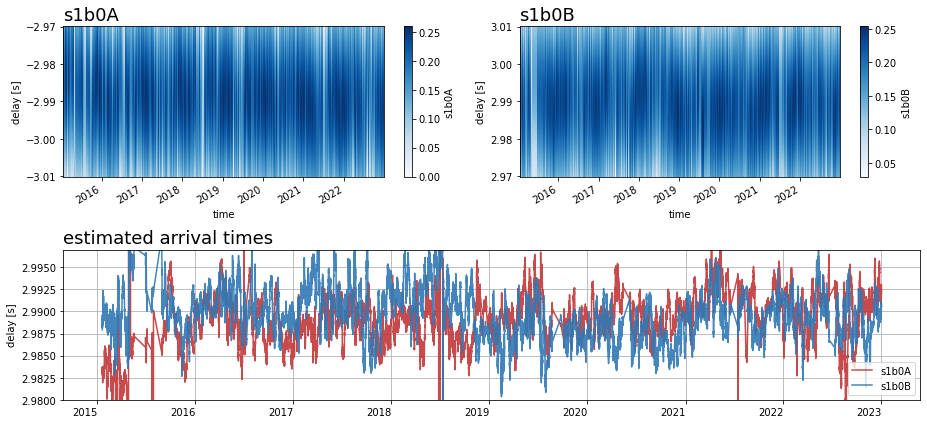

In [240]:
sns.set_palette('RdBu', 6)

fig = plt.figure(figsize=(13,6))

gs = gridspec.GridSpec(2,2)

ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1])
ax3 = fig.add_subplot(gs[1,:])

plt.sca(ax1)
plot1 = s1b0A.interp({'delay':np.linspace(-3.01, -2.97, 500)}, method='cubic').plot(x='time', cmap='Blues', vmin=0)
plot1.set_rasterized(True)
plt.title('')
plt.title('s1b0A', loc='left', fontsize=18)
plt.ylabel('delay [s]')

plt.sca(ax2)
plot2 = s1b0B.interp({'delay':np.linspace(2.97, 3.01, 500)}, method='cubic').plot(x='time', cmap='Blues')
plot2.set_rasterized(True)
plt.title('')
plt.title('s1b0B', loc='left', fontsize=18)
plt.ylabel('delay [s]')

plt.sca(ax3)
(at201['s1b0A']*-1).plot(label='s1b0A', c='C0', alpha=0.9)
at201['s1b0B'].plot(label='s1b0B', c='C5', alpha=0.9)
plt.title('')
plt.title('estimated arrival times', loc='left', fontsize=18)
plt.ylim([2.98,2.997])
plt.ylabel('delay [s]')
plt.xlabel('')
plt.xticks(rotation=0)
plt.legend()
plt.grid()

plt.tight_layout()

#fig.savefig('figures/second_whitening_peak_windows.svg', dpi=50)

#### compare to no second whitening

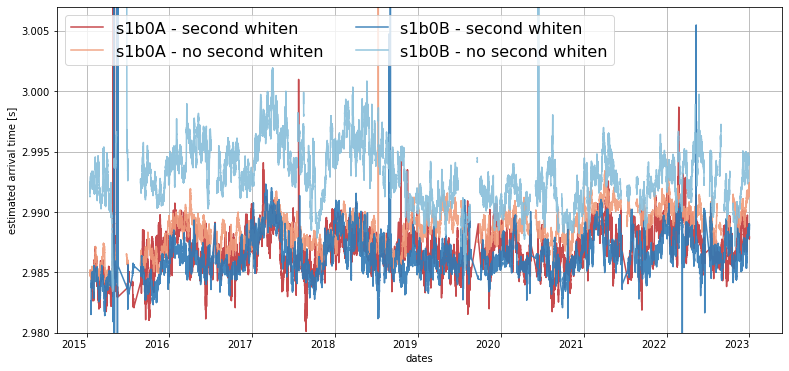

In [227]:
sns.set_palette('RdBu', 6)

fig = plt.figure(figsize=(13,6))

lines = (-1*at201['s1b0A']).plot(alpha=0.9, label='s1b0A - second whiten')
for line in lines:
    line.set_rasterized(True)
    
(-1*at_old['s1b0A']).plot(alpha=0.9, label='s1b0A - no second whiten')
for line in lines:
    line.set_rasterized(True)

lines = at201['s1b0B'].plot(alpha=0.9, c='C5', label='s1b0B - second whiten')
for line in lines:
    line.set_rasterized(True)
lines = at_old['s1b0B'].plot(alpha=0.9, c='C4', label='s1b0B - no second whiten')
for line in lines:
    line.set_rasterized(True)

plt.legend(ncol=2, loc='upper left', fontsize=16)

plt.ylim([2.98, 3.007])
_ = plt.xticks(rotation=0)
plt.grid()
plt.ylabel('estimated arrival time [s]')

fig.savefig('figures/second_whitening_comparison.svg', dpi=100)

#### effect of different cutoff frequencies on arrival time estimate

In [119]:
fcs = [5, 10, 20, 30, 40, 90]
ats={}

for fc in tqdm(fcs):
    b,a = signal.butter(4, [0.01, fc/100], btype='bandpass')

    peaks = {
        's1b0A':slice(-3.5, -2.5),
    }

    ats[fc] = inversion.calculate_arrival_times(NCCFs201, dim='delay', peaks=peaks, b=b, a=a)

100%|███████████████████████████████████████████████████████████████████████████████████| 6/6 [00:12<00:00,  2.16s/it]


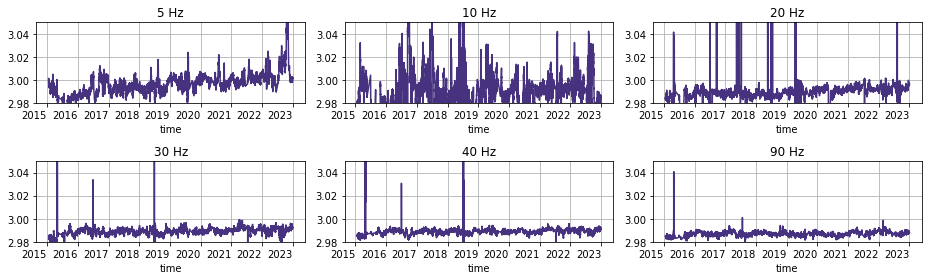

In [153]:
sns.set_palette('viridis', 6)

fig, axes = plt.subplots(2,3, figsize=(13,4))
axes = axes.flatten()

for k, fc in enumerate(ats.keys()):
    plt.sca(axes[k])
    (-1*ats[fc]['s1b0A']).plot()
    plt.title(f'{fc} Hz')
    plt.ylim([2.98, 3.05])
    plt.grid()
    plt.xticks(rotation=0)
    plt.ylabel('')
    
plt.tight_layout()

#### Compare to simulation

In [197]:
fn = '/datadrive/simulation/caldera_inversion_timeseries_HYCOM2.nc'
tdgfs = xr.open_dataarray(fn)
tdgfs = tdgfs.rename({'date':'time', 'time':'delay'})

In [198]:
at_sim = inversion.calculate_arrival_times(tdgfs, dim='delay', b=b, a=a, peaks={'s1b0':slice(2.5, 3.5)})

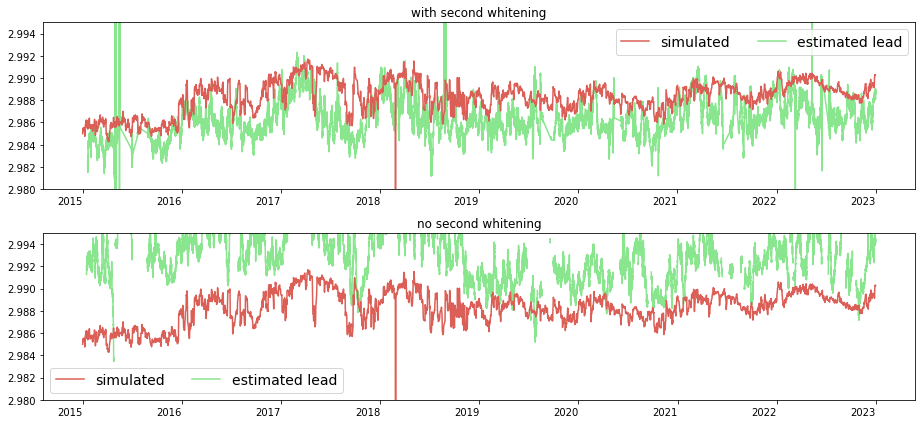

In [234]:
sns.set_palette("hls", 3)

fig, axes = plt.subplots(2,1, figsize=(13, 6))

plt.sca(axes[0])
(at_sim + 0.005)['s1b0'].plot(label='simulated', alpha=1, zorder=10)
#(-1*at201['s1b0A']).plot(label='estimated lag', alpha=0.7)
at201['s1b0B'].plot(label='estimated lead', alpha=0.7)
plt.ylim([2.98, 2.995])
_ = plt.xticks(rotation=0)
plt.legend(ncols=3, fontsize=14)
plt.xlabel('')
plt.ylabel('')
plt.title('with second whitening')

plt.sca(axes[1])
(at_sim + 0.005)['s1b0'].plot(label='simulated', alpha=1, zorder=10)
#(-1*at_old['s1b0A']).plot(label='estimated lag', alpha=0.7)
at_old['s1b0B'].plot(label='estimated lead', alpha=0.7)
plt.ylim([2.98, 2.995])
_ = plt.xticks(rotation=0)
plt.legend(ncols=3, fontsize=14)
plt.xlabel('')
plt.ylabel('')
plt.title('no second whitening')

plt.tight_layout()


fig.savefig('figures/second_whitening_simulation_leadonly.svg')

I think the biggest take away here, is that there is a trade off between</br>robustness to changing frequency illuminations and the noise of the estimated</br>arrival times. I'm hoping that a better whitening algorithm could help.

## Messing around with different ideas

#### Threshold whitening?

In [18]:
s1b0A = NCCFs201.sel({'delay':slice(-3.5, -2.5)})[20000,:]
s1b0A_f = xrft.fft(s1b0A, dim='delay').compute()

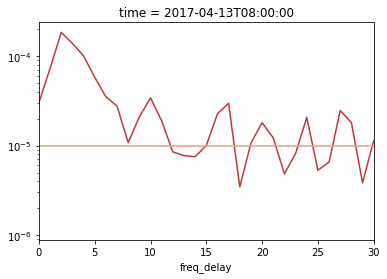

In [20]:
np.abs(s1b0A_f).plot()
plt.yscale('log')
plt.xlim([0,30])

plt.plot([-100,100], [1e-5, 1e-5])

In [ ]:
s1b0A_f_thresh = 

#### Other unnamed ideas?

In [ ]:
hdata = ODLintake.open_ooi_lfhydrophones()
hdata_slice = cloud_utils.slice_dx

In [66]:
s1b0A = NCCFs201[30000,:].sel({'delay':slice(-3.5, -2.500001)})

In [67]:
s1b0A

<xarray.DataArray 'random_sample-ee3db8cfae86a32195d4ba600f7a3975' (delay: 199)>
dask.array<getitem, shape=(199,), dtype=float64, chunksize=(199,), chunktype=numpy.ndarray>
Coordinates:
  * delay    (delay) float64 -3.495 -3.49 -3.485 -3.48 ... -2.515 -2.51 -2.505
    time     datetime64[ns] 2018-06-04

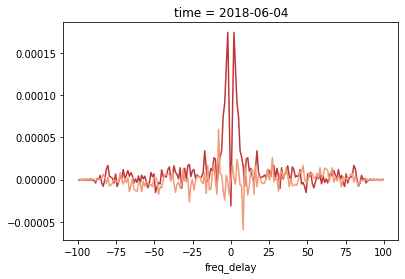

In [45]:
np.real(s1b0A_f).plot()
np.imag(s1b0A_f).plot()
s1b0A_f_mag = np.abs(s1b0A_f)

In [46]:
s1b0A_f_mag.loc[:-0.001] = -1*s1b0A_f_mag.loc[:-0.001]

In [58]:
s1b0A_t_mag = xrft.ifft(s1b0A_f_mag)

/home/jhrag/anaconda3/envs/ooi_dev/lib/python3.10/site-packages/xrft/xrft.py:546: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)


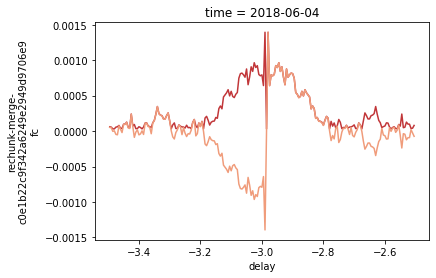

In [65]:
np.abs(s1b0A_t_mag).plot()
np.imag(s1b0A_t_mag).plot()

In [56]:
xrft.fft(s1b0A_t_mag).compute()

<xarray.DataArray (freq_delay: 199)>
array([ 5.89645210e-08-9.37373680e-07j, -1.76959347e-07+9.25697792e-07j,
        2.95181927e-07-9.02019658e-07j, -4.13890876e-07+8.65606494e-07j,
        5.33526643e-07-8.15124885e-07j, -6.54841672e-07+7.48238823e-07j,
        7.79166574e-07-6.60757343e-07j, -9.09463817e-07+5.44940215e-07j,
        1.04757410e-06-4.01801745e-07j, -1.03315897e-06-4.22708822e-08j,
       -1.80351308e-07+7.25127895e-07j, -3.81896215e-06-1.54450573e-06j,
        1.29872176e-06+2.69146420e-07j,  3.58606329e-07+9.26799632e-07j,
        5.16878708e-06+9.91639564e-07j, -3.95408715e-06+1.64403429e-06j,
       -7.65852378e-06+6.63053373e-06j,  2.40261340e-07+2.87516903e-06j,
        1.27258222e-05-4.33952452e-06j,  1.70133840e-05+2.95401212e-06j,
        4.23121226e-06-7.50731944e-06j,  2.94728848e-06-6.46018539e-06j,
        1.81721854e-06-3.78686689e-06j, -3.89084486e-06-2.27622767e-07j,
        6.86062667e-06-1.65639449e-06j, -7.95742015e-06-1.35083704e-06j,
       -3.25220130e-06-3.72565505e-06j,  5.17261087e-06+8.43530629e-06j,
        8.96246136e-07+3.38396183e-07j,  1.19889518e-05-5.13277270e-06j,
        1.18465171e-06+1.74698038e-06j,  5.48629394e-06-3.21589131e-06j,
        1.08535533e-05+2.95720213e-06j,  4.21562705e-06-1.39926895e-05j,
        8.40799769e-06-7.05590104e-06j,  4.37564327e-06+2.28639022e-06j,
       -3.75345912e-06-1.13846699e-05j,  9.90331063e-07-1.29089427e-05j,
       -3.29874208e-06-1.35152174e-05j,  4.56882136e-06-4.82665677e-06j,
...
       -3.29874208e-06+1.35152174e-05j,  9.90331063e-07+1.29089427e-05j,
       -3.75345912e-06+1.13846699e-05j,  4.37564327e-06-2.28639022e-06j,
        8.40799769e-06+7.05590104e-06j,  4.21562705e-06+1.39926895e-05j,
        1.08535533e-05-2.95720213e-06j,  5.48629394e-06+3.21589131e-06j,
        1.18465171e-06-1.74698038e-06j,  1.19889518e-05+5.13277270e-06j,
        8.96246136e-07-3.38396183e-07j,  5.17261087e-06-8.43530629e-06j,
       -3.25220130e-06+3.72565505e-06j, -7.95742015e-06+1.35083704e-06j,
        6.86062667e-06+1.65639449e-06j, -3.89084486e-06+2.27622767e-07j,
        1.81721854e-06+3.78686689e-06j,  2.94728848e-06+6.46018539e-06j,
        4.23121226e-06+7.50731944e-06j,  1.70133840e-05-2.95401212e-06j,
        1.27258222e-05+4.33952452e-06j,  2.40261340e-07-2.87516903e-06j,
       -7.65852378e-06-6.63053373e-06j, -3.95408715e-06-1.64403429e-06j,
        5.16878708e-06-9.91639564e-07j,  3.58606329e-07-9.26799632e-07j,
        1.29872176e-06-2.69146420e-07j, -3.81896215e-06+1.54450573e-06j,
       -1.80351308e-07-7.25127895e-07j, -1.03315897e-06+4.22708822e-08j,
        1.04757410e-06+4.01801745e-07j, -9.09463817e-07-5.44940215e-07j,
        7.79166574e-07+6.60757343e-07j, -6.54841672e-07-7.48238823e-07j,
        5.33526643e-07+8.15124885e-07j, -4.13890876e-07-8.65606494e-07j,
        2.95181927e-07+9.02019658e-07j, -1.76959347e-07-9.25697792e-07j,
        5.89645210e-08+9.37373680e-07j])
Coordinates:
    time        datetime64[ns] 2018-06-04
  * freq_delay  (freq_delay) float64 -99.5 -98.49 -97.49 ... 97.49 98.49 99.5

### peak fitting?

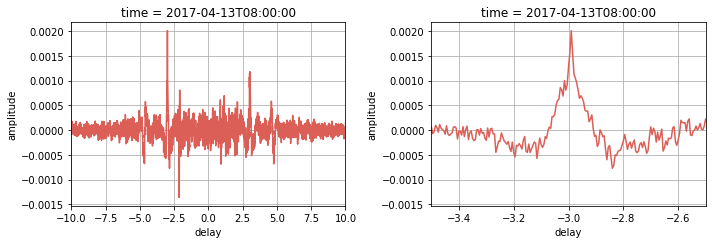

In [103]:
NCCF = NCCFs201[20000,:].load()

fig = plt.figure(figsize=(10,3.5))
plt.subplot(1,2, 1)
NCCF.plot()
plt.xlim([-10,10])
plt.grid()
_ = plt.ylabel('amplitude')

plt.subplot(1,2, 2)
NCCF.plot()
plt.xlim([-3.5,-2.5])
plt.grid()
_ = plt.ylabel('amplitude')

plt.tight_layout()

In [127]:
b,a = signal.butter(4, [0.01, 0.35], btype='bandpass')

s1b0A = NCCF.sel({'delay':slice(-3.5, -2.5)})
s1b0Aw = utils.freq_whiten(s1b0A, dim='delay', b=b, a=a)
s1b0Ac = xrsignal.hilbert_mag(s1b0Aw, dim='delay')

(-3.1, -2.9)

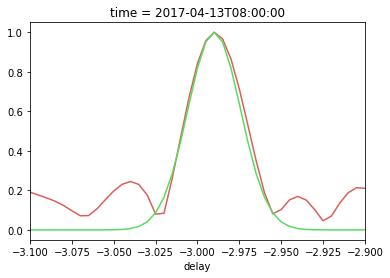

In [132]:
(s1b0Ac/s1b0Ac.max()).plot()

x = np.arange(-3.5, -2.5, 0.005)
plt.plot(x, gauss_pulse(x, -2.99, 0.0005))

plt.xlim([-3.1, -2.9])

In [185]:
def gauss_pulse(x, x0):
    sigma = 0.00053
    y = np.exp(-((x-x0)**2/sigma))
    return y

In [186]:
x_slice = slice(-3.025, -2.950)
x = s1b0Ac.delay.loc[x_slice]
y = s1b0Ac.sel({'delay':x_slice})

In [188]:
x0, cov = scipy.optimize.curve_fit(gauss_pulse, x, y, p0=(-3))

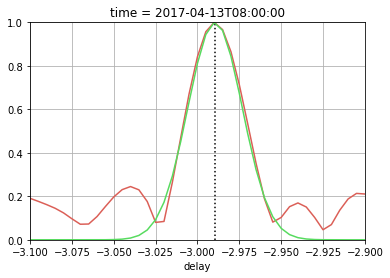

In [189]:
sns.set_palette("hls", 3)

(s1b0Ac/s1b0Ac.max()).plot()
plt.plot([x0,x0], [0, 1], 'k:')

plt.plot(s1b0Ac.delay.values, gauss_pulse(s1b0Ac.delay.values, x0))
plt.xlim([-3.1, -2.9])

plt.ylim([0,1])
plt.grid()

In [ ]:
NCCFs_slice = NCCFs201[::201,:]
xs = []

for k in tqdm(range(349)):
    
    b,a = signal.butter(4, [0.01, 0.35], btype='bandpass')

    s1b0A = NCCFs_slice[k,:].sel({'delay':slice(-3.5, -2.5)}).load()
    
    if np.isnan(s1b0A.values).any():
        xs.append(np.nan)
        continue

    else:
        s1b0Aw = utils.freq_whiten(s1b0A, dim='delay', b=b, a=a)
        s1b0Ac = xrsignal.hilbert_mag(s1b0Aw, dim='delay')

        x_slice = slice(-3.025, -2.950)
        x = s1b0Ac.delay.loc[x_slice].values
        y = s1b0Ac.sel({'delay':x_slice}).values

        x0, cov = scipy.optimize.curve_fit(gauss_pulse, x, y, p0=(-3))

        xs.append(float(x0))




  4%|██▊                                                              | 15/349 [00:10<03:56,  1.41it/s]Task exception was never retrieved
future: <Task finished name='Task-88248' coro=<Client._gather.<locals>.wait() done, defined at /home/jhrag/anaconda3/envs/ooi_dev/lib/python3.10/site-packages/distributed/client.py:2054> exception=AllExit()>
Traceback (most recent call last):
  File "/home/jhrag/anaconda3/envs/ooi_dev/lib/python3.10/site-packages/distributed/client.py", line 2063, in wait
    raise AllExit()
distributed.client.AllExit
Task exception was never retrieved
future: <Task finished name='Task-88662' coro=<Client._gather.<locals>.wait() done, defined at /home/jhrag/anaconda3/envs/ooi_dev/lib/python3.10/site-packages/distributed/client.py:2054> exception=AllExit()>
Traceback (most recent call last):
  File "/home/jhrag/anaconda3/envs/ooi_dev/lib/python3.10/site-packages/distributed/client.py", line 2063, in wait
    raise AllExit()
distributed.client.AllExit
Task exception wa

In [ ]:
plt.plot(NCCFs_slice.time, xs)

### AR whitening?

In [25]:
import statsmodels as sm

In [10]:
NCCFs201 = xr.open_dataarray('/datadrive/NCCFs/averaged/201.nc')
NCCFs201 = NCCFs201.chunk({'time':100,'delay':11999})

In [14]:
NCCF = NCCFs201[20000,:]
NCCF_Sxx = xrsignal.welch(NCCF, dim='delay', dB=True, fs=200)[:,0]
NCCF_Sxx = NCCF_Sxx - NCCF_Sxx.max()

In [53]:
ARmodel = sm.tsa.ar_model.AutoReg(NCCF.values, 200).fit()

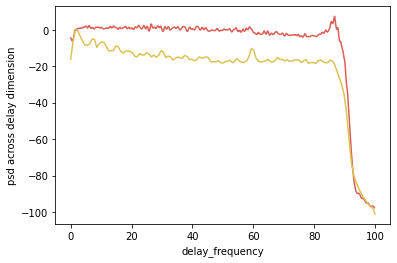

In [54]:
b = ARmodel.params
w,h = signal.freqz(b=1,a=b)

plt.plot(w/np.pi*100,20*np.log10(np.abs(h)))
NCCF_Sxx.plot()

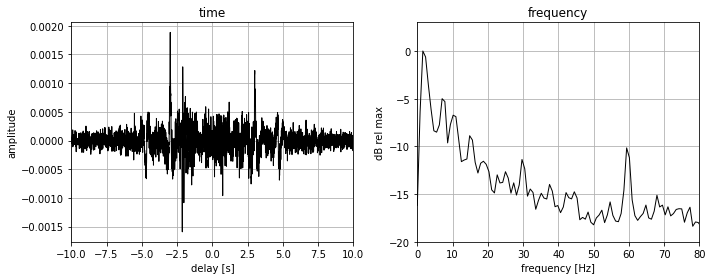

In [15]:
fig = plt.figure(figsize=(10, 4))

plt.subplot(1,2,1)
NCCF.plot(c='k', linewidth=1)
plt.xlim([-10,10])
plt.xlabel('delay [s]')
plt.ylabel('amplitude')
plt.title('time')
plt.grid()

plt.subplot(1,2,2)
NCCF_Sxx.plot(c='k', linewidth=1)
plt.ylim([-20,3])
plt.xlim([0,80])
plt.grid()
plt.xlabel('frequency [Hz]')
plt.ylabel('dB rel max')
plt.title('frequency')

plt.tight_layout()

In [18]:
s1b0A = NCCF.sel({'delay':slice(-3.5, -2.5)})

### Playing around

In [236]:
b,a = signal.butter(4, [0.01, 0.9], btype='bandpass')
NCCF_filt = xrsignal.filtfilt(NCCF, b=b, a=a, dim='delay')

s1b0B = NCCF_filt.sel({'delay':slice(2, 3.5)})
s1b0A = NCCF_filt.sel({'delay':slice(-3.5, -2.5)})

In [237]:
f, Sxx = signal.welch(s1b0B.values, return_onesided=False, nperseg=200)
#f = scipy.fft.fftshift(f)
#Sxx = scipy.fft.fftshift(Sxx)

In [238]:
Rxx = scipy.fft.ifft(Sxx).real
Rxx = scipy.fft.fftshift(Rxx)

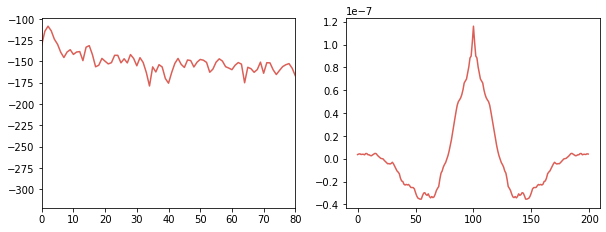

In [239]:
fig = plt.figure(figsize=(10,3.5))
plt.subplot(1,2,1)
plt.plot(20*np.log10(Sxx))
plt.xlim([0,80])

plt.subplot(1,2,2)
plt.plot(Rxx)

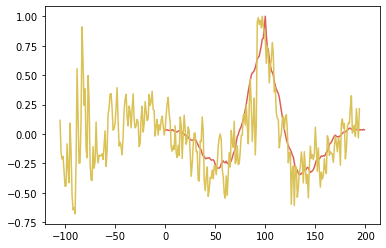

In [246]:
Rxx_c = signal.hilbert(Rxx)

angle = 10
shift = -105
Rxx_c_shift = Rxx_c*np.exp(1j*np.deg2rad(angle))

plt.plot(Rxx_c_shift.real/np.max(Rxx_c_shift.real))
plt.plot(np.arange(shift, 300+shift),s1b0B/s1b0B.max())


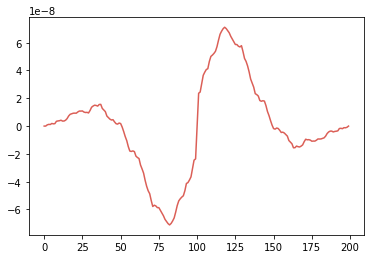

In [241]:
plt.plot(Rxx_c.imag)

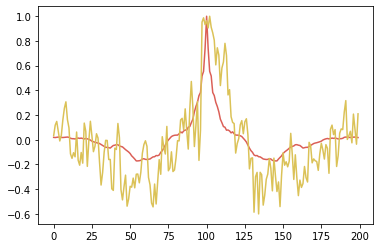

In [167]:
plt.plot(Rxx/np.max(Rxx))
plt.plot(s1b0A/s1b0A.max())

(-175.0, -125.0)

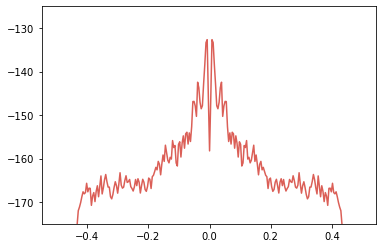

In [136]:
plt.plot(f, 20*np.log10(Sxx))
plt.ylim([-175,-125])

In [41]:
from statsmodels import regression

In [107]:
x = NCCF.sel({'delay':slice(-10, 0)})

In [116]:
order = 24
a, sigma = regression.linear_model.yule_walker(x.values, order=order)
b = np.array([1])

In [117]:
innovation = signal.convolve(x.values, a, 'valid')
d_ = signal.lfilter(b,a,innovation) # regenerate the signal
d_ = np.r_[d_[0] * np.ones(order), d_] #dummy samples to keep signal length

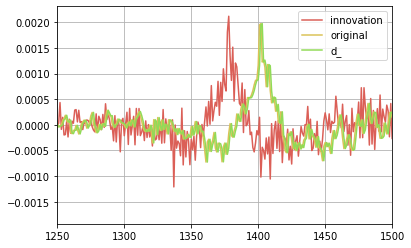

In [122]:
plt.plot(innovation, label='innovation')
plt.plot(x.values, label='original')
plt.plot(d_, label='d_')

plt.legend()
plt.xlim([1250, 1500])
plt.grid()

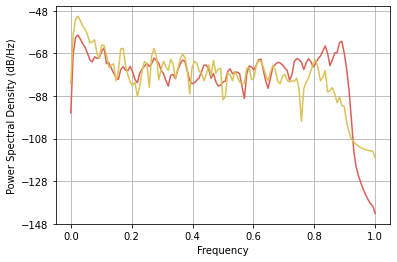

In [119]:
_ = plt.psd(innovation)
_ = plt.psd(s1b0A.values)